In [1]:
import tensorflow

In [2]:
# example of evaluating a decision tree with random undersampling
from numpy import mean
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from imblearn.pipeline import Pipeline
from imblearn.under_sampling import RandomUnderSampler
# define dataset
X, y = make_classification(n_samples=10000, weights=[0.99], flip_y=0)
# define pipeline
steps = [('under', RandomUnderSampler()), ('model', DecisionTreeClassifier())]
pipeline = Pipeline(steps=steps)
# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scores = cross_val_score(pipeline, X, y, scoring='f1_micro', cv=cv, n_jobs=-1)
score = mean(scores)
print('F-measure: %.3f' % score)


F-measure: 0.921


In [1]:
#note: set the font after any calls to sns.set_theme or other modifications 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
from matplotlib import rcParams 
sns.set_theme(style="ticks")
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Meiryo']

In [2]:
from sklearn.datasets import make_classification

# create the dataset
X, y = make_classification(n_samples=1000, n_features=2, n_redundant=0,
	n_clusters_per_class=1, weights=[0.99], flip_y=0, random_state=1)

In [3]:
X

array([[-0.12289294,  0.11047044],
       [ 0.33605863, -1.33226151],
       [ 1.40439918,  1.41694259],
       ...,
       [ 0.80192205,  0.75396037],
       [ 1.32341525,  1.16672256],
       [ 1.06274061,  0.24738282]])

In [8]:
y

array([0, 0, 0, ..., 0, 0, 0])

In [4]:
X.shape

(1000, 2)

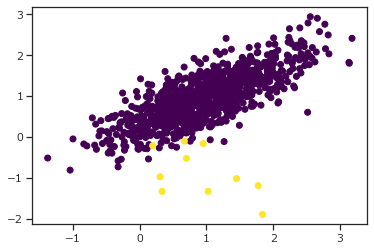

In [5]:
# scatter plot of examples by class label

plt.scatter(x=X[:, 0], y=X[:, 1], c=y, cmap="viridis")

# Effects of dataset siz

Size=100, Ratio=Counter({0: 99, 1: 1})
Size=1000, Ratio=Counter({0: 990, 1: 10})
Size=10000, Ratio=Counter({0: 9900, 1: 100})
Size=100000, Ratio=Counter({0: 99000, 1: 1000})


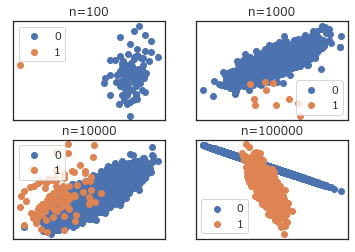

In [17]:
# vary the dataset size for a 1:100 imbalanced dataset
from collections import Counter
from sklearn.datasets import make_classification
from matplotlib import pyplot
from numpy import where
# dataset sizes
sizes = [100, 1000, 10000, 100000]
# create and plot a dataset with each size
for i in range(len(sizes)):
	# determine the dataset size
	n = sizes[i]
	# create the dataset
	X, y = make_classification(n_samples=n, n_features=2, n_redundant=0,
		n_clusters_per_class=1, weights=[0.99], flip_y=0, random_state=1)
	# summarize class distribution
	counter = Counter(y)
	print('Size=%d, Ratio=%s' % (n, counter))
	# define subplot
	pyplot.subplot(2, 2, 1+i)
	pyplot.title('n=%d' % n)
	pyplot.xticks([])
	pyplot.yticks([])


	# scatter plot of examples by class label
    # note the use of Counter here to assign labels such that they will appear on the figure legend
	for label, _ in counter.items():
		row_ix = where(y == label)[0]
		pyplot.scatter(X[row_ix, 0], X[row_ix, 1], label=str(label))
	pyplot.legend()
# show the figure
pyplot.show()

# PR AUC

In [2]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import average_precision_score, precision_recall_curve
from sklearn.metrics import auc, plot_precision_recall_curve
import matplotlib.pyplot as plt

random_state = 416
# Create dataset for binary classification with 5 predictors
X, y = datasets.make_classification(n_samples=1000,
                                    n_features=5,
                                    n_informative=3,
                                    n_redundant=2,
                                    random_state=random_state)

# Split into training and test
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=.4,
                                                    random_state=random_state)

# Get the predicited probability of testing data
y_score = classifier.predict_proba(X_test)[:, 1]                                                    

# Create classifier using logistic regression
classifier = LogisticRegression(random_state=random_state)
classifier.fit(X_train, y_train)
# Data to plot precision - recall curve
precision, recall, thresholds = precision_recall_curve(y_test, y_score)
# Use AUC function to calculate the area under the curve of precision recall curve
auc_precision_recall = auc(recall, precision)
print(auc_precision_recall)


0.9053487302244206


In [9]:
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
import numpy as np

def precision_recall_auc(y_true, y_pred):
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred, pos_label=1)
    return auc(recall, precision)

pr_auc = make_scorer(score_func=precision_recall_auc, needs_proba=True)

cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=10, random_state=random_state)
scores = cross_val_score(classifier, X, y, scoring=pr_auc, cv=cv, n_jobs=-1)

np.mean(scores)

0.8778450269620701

# imbalanced logistic regression

Counter({0: 9900, 1: 100})


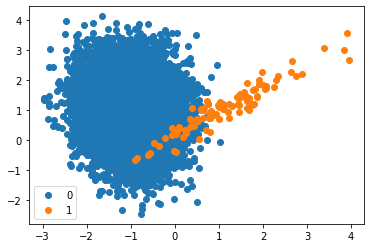

In [2]:
# Generate and plot a synthetic imbalanced classification dataset
from collections import Counter
from sklearn.datasets import make_classification
from matplotlib import pyplot
from numpy import where
# define dataset
X, y = make_classification(n_samples=10000, n_features=2, n_redundant=0,
n_clusters_per_class=1, weights=[0.99], flip_y=0, random_state=2)
# summarize class distribution
counter = Counter(y)
print(counter)
# scatter plot of examples by class label
for label, _ in counter.items():
    row_ix = where(y == label)[0]
    pyplot.scatter(X[row_ix, 0], X[row_ix, 1], label=str(label))
pyplot.legend()
pyplot.show()

In [6]:
for label, _ in counter.items():
    print(label)
    print(_)

0
9900
1
100
